In [1]:
# to load json files
import json
# datetime oprations
from datetime import timedelta
# to get web contents
from urllib.request import urlopen

# for numerical analyiss
import numpy as np
# to store and process data in dataframe
import pandas as pd
# basic visualization package
import matplotlib.pyplot as plt
# advanced ploting
import seaborn as sns

# interactive visualization
import plotly.express as px
import plotly.graph_objs as go
# import plotly.figure_factory as ff
from plotly.subplots import make_subplots
# for offline ploting
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)
# hide warnings
import warnings
warnings.filterwarnings('ignore')
# color pallette
cnf, dth, rec, act = '#393e46', '#ff2e63', '#21bf73', '#fe9801' 
from wordcloud import WordCloud

# DataSet

In [2]:
# Full data
# =========

full_table = pd.read_csv('C:\\Users\\CARNIVAL\\Desktop\\New folder (4)\\New folder (2)\\covid_19_clean_complete.csv')
#full_table.head()

In [3]:
# Grouped by day, country
# =======================

full_grouped = pd.read_csv('C:\\Users\\CARNIVAL\\Desktop\\New folder (4)\\New folder (2)\\full_grouped.csv')
full_grouped['Date'] = pd.to_datetime(full_grouped['Date'])
# full_grouped.head()=

In [4]:
# Day wise
# ========

day_wise = pd.read_csv('C:\\Users\\CARNIVAL\\Desktop\\New folder (4)\\New folder (2)\\day_wise.csv')
day_wise['Date'] = pd.to_datetime(day_wise['Date'])
day_wise.head()

,Date,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,No. of countries
0,2020-01-22,555,17,28,510,0,0,0,3.06,5.05,60.71,6
1,2020-01-23,654,18,30,606,99,1,2,2.75,4.59,60.00,8
2,2020-01-24,941,26,36,879,287,8,6,2.76,3.83,72.22,9
3,2020-01-25,1434,42,39,1353,493,16,3,2.93,2.72,107.69,11
4,2020-01-26,2118,56,52,2010,684,14,13,2.64,2.46,107.69,13


In [5]:
# Country wise
# ============

country_wise = pd.read_csv('C:\\Users\\CARNIVAL\\Desktop\\New folder (4)\\New folder (2)\\country_wise_latest.csv')
country_wise = country_wise.replace('', np.nan).fillna(0)
country_wise.head()

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,27532,546,7660,19326,658,42,1502,1.98,27.82,7.13,22890,4642,20.28,Eastern Mediterranean
1,Albania,1788,39,1086,663,66,1,9,2.18,60.74,3.59,1385,403,29.10,Europe
2,Algeria,11385,811,8078,2496,117,12,135,7.12,70.95,10.04,10589,796,7.52,Africa
3,Andorra,855,52,792,11,1,0,1,6.08,92.63,6.57,852,3,0.35,Europe
4,Angola,166,8,64,94,11,1,0,4.82,38.55,12.50,118,48,40.68,Africa


In [6]:
# Worldometer data
# ================

worldometer_data = pd.read_csv('C:\\Users\\CARNIVAL\\Desktop\\New folder (4)\\New folder (2)\\worldometer_data.csv')
worldometer_data = worldometer_data.replace('', np.nan).fillna(0)
worldometer_data.head()

,Country/Region,Continent,Population,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region
0,USA,North America,3.309388e+08,2263749,98.0,120688.0,0.0,931076.0,82.0,1211985.0,16503.0,6840.0,365.0,26724848.0,80755.0,Americas
1,Brazil,South America,2.125087e+08,983359,0.0,47869.0,0.0,520360.0,16853.0,415130.0,8318.0,4627.0,225.0,2344437.0,11032.0,Americas
2,Russia,Europe,1.459326e+08,569063,7972.0,7841.0,181.0,324406.0,10443.0,236816.0,2300.0,3899.0,54.0,16321964.0,111846.0,Europe
3,India,Asia,1.379530e+09,381485,394.0,12605.0,1.0,205183.0,1.0,163697.0,8944.0,277.0,9.0,6426627.0,4659.0,South-EastAsia
4,UK,Europe,6.787438e+07,300469,0.0,42288.0,0.0,0.0,0.0,0.0,379.0,4427.0,623.0,7259555.0,106956.0,Europe


In [7]:
temp = day_wise[['Date','Deaths', 'Recovered', 'Active']].tail(1)
temp = temp.melt(id_vars="Date", value_vars=['Active', 'Deaths', 'Recovered'])
fig = px.treemap(temp, path=["variable"], values="value", height=225, 
                 color_discrete_sequence=[act, rec, dth])
fig.data[0].textinfo = 'label+text+value'
fig.show()

# Maps

In [8]:
def plot_map(df, col, pal):
    df = df[df[col]>0]
    fig = px.choropleth(df, locations="Country/Region", locationmode='country names', 
                  color=col, hover_name="Country/Region", 
                  title=col, hover_data=[col], color_continuous_scale=pal)
#     fig.update_layout(coloraxis_showscale=False)
    fig.show()
plot_map(country_wise, 'Confirmed', 'matter')

In [9]:
plot_map(country_wise, 'Deaths', 'matter')

In [10]:
# Over the time

fig = px.choropleth(full_grouped, locations="Country/Region", 
                    color=np.log(full_grouped["Confirmed"]),
                    locationmode='country names', hover_name="Country/Region", 
                    animation_frame=full_grouped["Date"].dt.strftime('%Y-%m-%d'),
                    title='Cases over time', color_continuous_scale=px.colors.sequential.matter)
fig.update(layout_coloraxis_showscale=True)
fig.show()


There are 1959 words in the combination of all cells in column Country/Region.


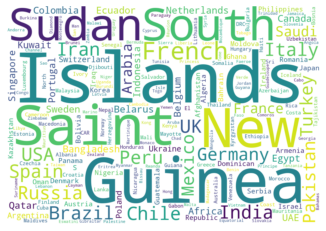

<Figure size 2880x1440 with 0 Axes>

In [11]:
# Python program to generate WordCloud for column Country/Region
# Text of all words in column Country/Region
text = " ".join(review for review in worldometer_data['Country/Region'].astype(str))
print ("There are {} words in the combination of all cells in column Country/Region.".format(len(text)))
# Generate a word cloud image
wordcloud = WordCloud( background_color="white", width=1150, height=800).generate(text)
# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.figure( figsize=(40,20))
plt.show()

In [12]:
temp = day_wise[['Date', 'Recovered', 'Active']]
temp = temp.melt(id_vars='Date', value_vars=['Recovered', 'Active'], 
                 var_name='Variable', value_name='Count')
px.line(temp, x='Date', y='Count', color='Variable')

In [13]:
# Top 20 Countries

In [14]:
def plot_hbar(df, col, n, hover_data=[]):
    fig = px.bar(df.sort_values(col).tail(n), 
                 x=col, y="Country/Region", color='WHO Region',  
                 text=col, orientation='h', width=700, hover_data=hover_data,
                 color_discrete_sequence = px.colors.qualitative.Dark2)
    fig.update_layout(title=col, xaxis_title="", yaxis_title="", 
                      yaxis_categoryorder = 'total ascending',
                      uniformtext_minsize=8, uniformtext_mode='hide')
    fig.show()
def plot_hbar_wm(col, n, min_pop=1000000, sort='descending'):
    df = worldometer_data[worldometer_data['Population']>min_pop]
    df = df.sort_values(col, ascending=True).tail(n)
    fig = px.bar(df,
                 x=col, y="Country/Region", color='WHO Region',  
                 text=col, orientation='h', width=700, 
                 color_discrete_sequence = px.colors.qualitative.Dark2)
    fig.update_layout(title=col+' (Only countries with > 1M Pop)', 
                      xaxis_title="", yaxis_title="", 
                      yaxis_categoryorder = 'total ascending',
                      uniformtext_minsize=8, uniformtext_mode='hide')
    fig.show()
# plot_hbar(country_wise, 'Confirmed', 20)

In [15]:
plot_hbar(country_wise, 'Active', 20)

In [16]:
plot_hbar(country_wise, 'New cases', 20)

In [17]:
plot_hbar(country_wise, 'Deaths', 20)

In [18]:
plot_hbar(country_wise, 'Recovered', 20)

# Confirmed vs Deaths

In [19]:
fig = px.scatter(country_wise.sort_values('Deaths', ascending=False).iloc[:20, :], 
                 x='Confirmed', y='Deaths', color='Country/Region', size='Confirmed', 
                 height=700, text='Country/Region', log_x=True, log_y=True, 
                 title='Deaths vs Confirmed (Scale is in log10)')
fig.update_traces(textposition='top center')
fig.update_layout(showlegend=False)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [20]:
def plot_treemap(col):
    fig = px.treemap(country_wise, path=["Country/Region"], values=col, height=700,
                 title=col, color_discrete_sequence = px.colors.qualitative.Dark2)
    fig.data[0].textinfo = 'label+text+value'
    fig.show()
plot_treemap('Confirmed')

In [21]:
plot_treemap('Deaths')

# Bubble Plot

In [22]:
def plot_bubble(col, pal):
    temp = full_grouped[full_grouped[col]>0].sort_values('Country/Region', ascending=False)
    fig = px.scatter(temp, x='Date', y='Country/Region', size=col, color=col, height=3000,
                    color_continuous_scale=pal)
    fig.update_layout(yaxis = dict(dtick = 1))
    fig.update(layout_coloraxis_showscale=False)
    fig.show()
plot_bubble('New cases', 'Viridis')

In [23]:
plot_bubble('Active', 'Viridis')

In [24]:
plot_bubble('Recovered', 'Viridis')

# USA

In [26]:
usa_df = pd.read_csv('C:\\Users\\CARNIVAL\\Desktop\\New folder (4)\\New folder (2)\\usa_county_wise.csv')
usa_latest = usa_df[usa_df['Date'] == max(usa_df['Date'])]
usa_grouped = usa_latest.groupby('Province_State')['Confirmed', 'Deaths'].sum().reset_index()
usa_grouped = usa_latest.groupby('Province_State')['Confirmed', 'Deaths'].sum().reset_index()
usa_grouped.head(10)

,Province_State,Confirmed,Deaths
0,Alabama,21422,726
1,Alaska,572,39
2,American Samoa,0,0
3,Arizona,28296,1078
4,Arkansas,10080,161
5,California,136641,4747
6,Colorado,28333,1553
7,Connecticut,44179,4097
8,Delaware,10020,410
9,Diamond Princess,49,0


In [27]:
us_code = {'Alabama': 'AL', 'Alaska': 'AK', 'American Samoa': 'AS', 'Arizona': 'AZ', 'Arkansas': 'AR', 
    'California': 'CA','Colorado': 'CO','Connecticut': 'CT','Delaware': 'DE', 'District of Columbia': 'DC', 
    'Florida': 'FL', 'Georgia': 'GA', 'Guam': 'GU', 'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL',
    'Indiana': 'IN','Iowa': 'IA','Kansas': 'KS','Kentucky': 'KY','Louisiana': 'LA','Maine': 'ME',
    'Maryland': 'MD','Massachusetts': 'MA','Michigan': 'MI','Minnesota': 'MN','Mississippi': 'MS',
    'Missouri': 'MO','Montana': 'MT','Nebraska': 'NE','Nevada': 'NV','New Hampshire': 'NH', 'New Jersey': 'NJ',
    'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC', 'North Dakota': 'ND', 'Northern Mariana Islands':'MP',
    'Ohio': 'OH', 'Oklahoma': 'OK', 'Oregon': 'OR', 'Pennsylvania': 'PA', 'Puerto Rico': 'PR',
    'Rhode Island': 'RI', 'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX',
    'Utah': 'UT', 'Vermont': 'VT', 'Virgin Islands': 'VI', 'Virginia': 'VA', 'Washington': 'WA',
    'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'}

usa_grouped['Code'] = usa_grouped['Province_State'].map(us_code)

In [28]:
fig = px.choropleth(usa_grouped, color='Confirmed', locations='Code', locationmode="USA-states", 
                    scope="usa", color_continuous_scale="RdGy", title='No. of cases in USA')
fig

In [29]:
who = country_wise.groupby('WHO Region')['Confirmed', 'Deaths', 'Recovered', 'Active',
                                         'New cases', 'Confirmed last week'].sum().reset_index()
who['Fatality Rate'] = round((who['Deaths'] / who['Confirmed']) * 100, 2)
who['Recovery Rate'] = (who['Recovered'] / who['Confirmed']) * 100

who_g = full_grouped.groupby(['WHO Region', 'Date'])['Confirmed', 'Deaths', 'Recovered', 
                                                     'Active','New cases', 'New deaths'].sum().reset_index()
def plot_hbar(col, hover_data=[]):
    fig = px.bar(who.sort_values(col), 
                 x=col, y="WHO Region", color='WHO Region',  
                 text=col, orientation='h', width=700, hover_data=hover_data,
                 color_discrete_sequence = px.colors.qualitative.Dark2)
    fig.update_layout(title=col, xaxis_title="", yaxis_title="", 
                      yaxis_categoryorder = 'total ascending',
                      uniformtext_minsize=8, uniformtext_mode='hide')
    fig.show()


In [30]:
plot_hbar('Deaths')

In [31]:
plot_hbar('Recovered')

In [32]:
temp = worldometer_data[worldometer_data['WHO Region']!=0]
fig = px.scatter(temp, x='TotalCases', y='TotalDeaths', color='WHO Region', 
                 height=700, hover_name='Country/Region', log_x=True, log_y=True, 
                 title='Confirmed vs Deaths',
                 color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_traces(textposition='top center')
fig.show()

In [33]:
px.box(worldometer_data, x='WHO Region', y='TotalCases', color='WHO Region',
       title='Distribution of country wise no. of cases in different WHO Region')

# Healthy life expectancy vs Deaths / 100 Cases

In [35]:
happiness_report = pd.read_csv('C:\\Users\\CARNIVAL\\Desktop\\New folder (4)\\New folder (2)\\2019.csv')
happiness_report = happiness_report[['Country or region', 'Healthy life expectancy']]

temp = country_wise.merge(happiness_report, left_on='Country/Region', right_on='Country or region')
px.scatter(temp, y='Deaths / 100 Cases', x='Healthy life expectancy', color='WHO Region', hover_data=['Country/Region'])